# EE/CS 148B HW4 Diffusion - Constantin Cedillo


# Part 4: Code your own diffusion models

In [1]:
import functools
import os
import random
import torch
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from tqdm.notebook import trange, tqdm
from torchvision.datasets import FashionMNIST
from torch.optim import Adam
from torch.utils.data import DataLoader

In [2]:
device = 'cuda'

References:

- [[Song21]](https://openreview.net/pdf?id=PxTIG12RRHS) Score-Based Generative Modeling Through Stochastic Differential Equations
- Yang Song's blog

## Variance Preserving SDE (VP)

Variance Preserving diffusion SDE (Eq 11 in [Song21]):

\begin{align*}
d \mathbf{x} = - \frac{1}{2} \beta(t) \mathbf{x} dt + \sqrt{\beta(t)}d\mathbf{w}
\end{align*}

This follows the general SDE form $d \mathbf{x} = f(\mathbf{x}, t) dt + g(t) d \mathbf{w}$. We call $f(\mathbf{x}, t)$ the **drift coefficient** and $g(t)$ the **diffusion coefficient**.

The corresponding general conditional linear Gaussian distribution is:
\begin{align*}
p(x_0|x_t) = \mathcal{N}(x_t; \alpha(t)x_0, \sigma^2(t)I)
\end{align*}
where $\alpha: [0,1] \rightarrow \mathbb{R}$,  $\sigma: [0,1] \rightarrow \mathbb{R}$

$\mu(t), \sigma(t)$ can be derived analytically from $f(\mathbf{x}, t), g(t)$.

\begin{align*}
\begin{cases}
  \mu(t) = \alpha(t)x_0 = \exp{(c(t))}x_0 \\
  \sigma^2(t) = 1 - \exp(2c(t))
\end{cases}
\end{align*}

### Implementing the VP SDE

Refer to Equations (32) and (33) in [Song21] to identify:
* $\beta(t)$
* $c(t)$
* $\mu(t)$
* $\sigma(t)$

Fill in the TODOs in the VP class accordingly

In [3]:
class VP():
    def __init__(self, beta_min, beta_max, num_steps):
        self.beta_0 = beta_min
        self.beta_1 = beta_max
        self.num_steps = num_steps
        self.discrete_betas = torch.linspace(beta_min / num_steps, beta_max / num_steps, num_steps)
        self.alphas = 1. - self.discrete_betas

    def _prepare_t(self, t, device=None):
        if torch.is_tensor(t):
            t = t.float()
            if device is not None:
                t = t.to(device)
        else:
            t = torch.tensor(t, dtype=torch.float32, device=device)
        if t.ndim == 0:
            t = t[None]
        return t

    def _beta_t(self, t):
        return self.beta_0 + t * (self.beta_1 - self.beta_0)

    def _c_t(self, t):
        return torch.exp(-0.5 * self.beta_0 * t - 0.25 * (self.beta_1 - self.beta_0) * t ** 2)

    def marginal_proba(self, x, t):
        device = x.device if torch.is_tensor(x) else None
        t = self._prepare_t(t, device)
        c_t = self._c_t(t)
        std_t = torch.sqrt(torch.clamp(1. - c_t ** 2, min=1e-12))
        if torch.is_tensor(x):
            if c_t.numel() == 1 and x.shape[0] != 1:
                c_t = c_t.expand(x.shape[0])
                std_t = std_t.expand(x.shape[0])
            shape = [x.shape[0]] + [1] * (x.ndim - 1)
            mu_t = x * c_t.reshape(shape)
        else:
            mu_t = x * c_t
        return mu_t, std_t

    def marginal_prob(self, x, t):
        return self.marginal_proba(x, t)

    def drift(self, x, t):
        t = self._prepare_t(t, x.device)
        beta_t = self._beta_t(t)
        if beta_t.numel() == 1 and x.shape[0] != 1:
            beta_t = beta_t.expand(x.shape[0])
        shape = [x.shape[0]] + [1] * (x.ndim - 1)
        return -0.5 * beta_t.reshape(shape) * x

    def diffusion(self, t):
        t = self._prepare_t(t)
        return torch.sqrt(self._beta_t(t))

## Sampling with VP sde

As per Appendix E of [Song21], recall that for any SDE of the form
\begin{align*}
d \mathbf{x} = \mathbf{f}(\mathbf{x}, t) dt + g(t) d\mathbf{w},
\end{align*}
the reverse-time SDE is given by
\begin{align*}
d \mathbf{x} = [\mathbf{f}(\mathbf{x}, t) - g(t)^2 \nabla_\mathbf{x} \log p_t(\mathbf{x})] dt + g(t) d \bar{\mathbf{w}}.
\end{align*}

We use the [Euler-Maruyama](https://en.wikipedia.org/wiki/Euler%E2%80%93Maruyama_method) numerical method to solve for the reverse-time SDE. This method relies on discretizing the SDE, replacing $dt$ with $\Delta t$ and $d \mathbf{w}$ with $\mathbf{z} \sim \mathcal{N}(\mathbf{0}, g^2(t) \Delta t \mathbf{I})$.

This lead to the following iteration rule:
\begin{align}
\mathbf{x}_{t-\Delta t} =
\mathbf{x}_t
- \mathbf{f}(\mathbf{x}_t, t)\Delta t
+ g^2(t) s_\theta(\mathbf{x}_t, t)\Delta t
+ g(t)\sqrt{\Delta_t}\mathbf{z}_t.
\end{align}

Note: for the last step (i.e. $t-\Delta_t = 0$), we do not wish to add back noise ($g(t)\sqrt{\Delta_t}\mathbf{z}_t$).

In [4]:
def Euler_Maruyama_sampler(score_model,
                           sde,
                           batch_size,
                           num_steps=1000,
                           device='cuda',
                           eps=1e-3):
    device = torch.device(device)
    sample_shape = (batch_size, 1, 28, 28)
    t = torch.ones(batch_size, device=device)
    _, std = sde.marginal_proba(torch.zeros(sample_shape, device=device), t)
    x = torch.randn(sample_shape, device=device) * std[:, None, None, None]
    time_steps = torch.linspace(1., eps, num_steps, device=device)
    step_size = time_steps[0] - time_steps[1]
    x_mean = x
    with torch.no_grad():
        for time_step in tqdm(time_steps):
            batch_time_steps = torch.ones(batch_size, device=device) * time_step
            score = score_model(x, batch_time_steps)
            drift = sde.drift(x, batch_time_steps)
            diffusion = sde.diffusion(batch_time_steps)[:, None, None, None]
            x_mean = x - (drift - diffusion ** 2 * score) * step_size
            x = x_mean + torch.sqrt(step_size) * diffusion * torch.randn_like(x)
    return torch.clamp(x_mean, 0., 1.)

In [5]:
def predictor_corrector_sampler(score_model,
                                sde,
                                batch_size,
                                num_steps=1000,
                                device='cuda',
                                snr=0.16,
                                num_corrector_steps=1,
                                eps=1e-3):
    device = torch.device(device)
    sample_shape = (batch_size, 1, 28, 28)
    t = torch.ones(batch_size, device=device)
    _, std = sde.marginal_proba(torch.zeros(sample_shape, device=device), t)
    x = torch.randn(sample_shape, device=device) * std[:, None, None, None]
    time_steps = torch.linspace(1., eps, num_steps, device=device)
    step_size = time_steps[0] - time_steps[1]
    alphas = sde.alphas.to(device)
    x_mean = x
    with torch.no_grad():
        for time_step in tqdm(time_steps):
            batch_time_steps = torch.ones(batch_size, device=device) * time_step
            int_time_step = min(sde.num_steps - 1, max(0, int(time_step.item() * (sde.num_steps - 1))))
            alpha_t = alphas[int_time_step]
            for j in range(num_corrector_steps):
                score = score_model(x, batch_time_steps)
                noise = torch.randn_like(x)
                grad_norm = torch.norm(score.reshape(score.shape[0], -1), dim=-1).mean()
                noise_norm = torch.norm(noise.reshape(noise.shape[0], -1), dim=-1).mean()
                langevin_step_size = 2 * alpha_t * (snr * noise_norm / (grad_norm + 1e-12)) ** 2
                x = x + langevin_step_size * score + torch.sqrt(2 * langevin_step_size) * noise
            score = score_model(x, batch_time_steps)
            drift = sde.drift(x, batch_time_steps)
            diffusion = sde.diffusion(batch_time_steps)[:, None, None, None]
            x_mean = x - (drift - diffusion ** 2 * score) * step_size
            x = x_mean + torch.sqrt(step_size) * diffusion * torch.randn_like(x)
    return torch.clamp(x_mean, 0., 1.)

## Setup -- no TODOs to fill in here :)

### Config

In [6]:
n_epochs = 50
batch_size = 64
lr = 1e-4
num_steps=1000
checkpoint_dir = './checkpoints/'

### Dataset

In [7]:
# training dataset
train_transforms = transforms.Compose([transforms.ToTensor()])
train_dataset = FashionMNIST('.', train=True, transform=train_transforms, download=True);
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

100%|██████████| 26.4M/26.4M [00:02<00:00, 10.7MB/s]
100%|██████████| 29.5k/29.5k [00:00<00:00, 170kB/s]
100%|██████████| 4.42M/4.42M [00:01<00:00, 3.26MB/s]
100%|██████████| 5.15k/5.15k [00:00<00:00, 20.5MB/s]


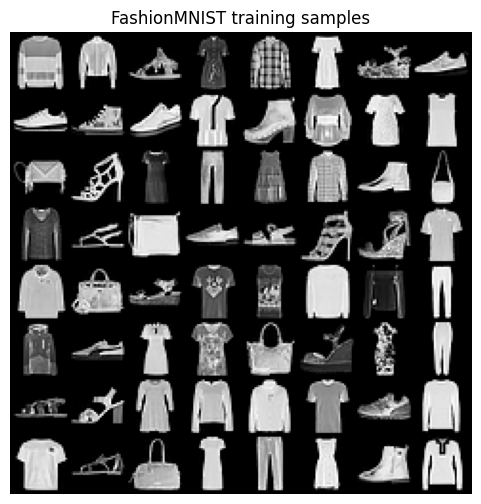

['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
(28, 28)


In [8]:
from torchvision.utils import make_grid

dataset_images, dataset_labels = next(iter(train_loader))
dataset_grid = make_grid(dataset_images[:64], nrow=8)
plt.figure(figsize=(6, 6))
plt.axis('off')
plt.title('FashionMNIST training samples')
plt.imshow(dataset_grid.permute(1, 2, 0).squeeze(), cmap='gray')
plt.show()
print(train_dataset.classes)
print(tuple(dataset_images.shape[-2:]))

### Score-matching model

In [9]:
import torch.nn as nn
import torch.nn.functional as F

class GaussianFourierProjection(nn.Module):
    """Gaussian random features for encoding time steps."""
    def __init__(self, embed_dim, scale=30.):
        super().__init__()
        # Randomly sample weights during initialization. These weights are fixed
        # during optimization and are not trainable.
        self.W = nn.Parameter(torch.randn(embed_dim // 2) * scale, requires_grad=False)
    def forward(self, x):
        x_proj = x[:, None] * self.W[None, :] * 2 * np.pi
        return torch.cat([torch.sin(x_proj), torch.cos(x_proj)], dim=-1)


class Dense(nn.Module):
    """A fully connected layer that reshapes outputs to feature maps."""
    def __init__(self, input_dim, output_dim):
        super().__init__()
        self.dense = nn.Linear(input_dim, output_dim)
    def forward(self, x):
        return self.dense(x)[..., None, None]


class ScoreNet(nn.Module):
    """A time-dependent score-based model built upon U-Net architecture."""

    def __init__(self, marginal_proba, channels=[32, 64, 128, 256], embed_dim=256):
        """Initialize a time-dependent score-based network.

        Args:
          marginal_proba: A function that takes time t and gives the standard
            deviation of the perturbation kernel p_{0t}(x(t) | x(0)).
          channels: The number of channels for feature maps of each resolution.
          embed_dim: The dimensionality of Gaussian random feature embeddings.
        """
        super().__init__()
        # Gaussian random feature embedding layer for time
        self.embed = nn.Sequential(GaussianFourierProjection(embed_dim=embed_dim),
             nn.Linear(embed_dim, embed_dim))
        # Encoding layers where the resolution decreases
        self.conv1 = nn.Conv2d(1, channels[0], 3, stride=1, bias=False)
        self.dense1 = Dense(embed_dim, channels[0])
        self.gnorm1 = nn.GroupNorm(4, num_channels=channels[0])
        self.conv2 = nn.Conv2d(channels[0], channels[1], 3, stride=2, bias=False)
        self.dense2 = Dense(embed_dim, channels[1])
        self.gnorm2 = nn.GroupNorm(32, num_channels=channels[1])
        self.conv3 = nn.Conv2d(channels[1], channels[2], 3, stride=2, bias=False)
        self.dense3 = Dense(embed_dim, channels[2])
        self.gnorm3 = nn.GroupNorm(32, num_channels=channels[2])
        self.conv4 = nn.Conv2d(channels[2], channels[3], 3, stride=2, bias=False)
        self.dense4 = Dense(embed_dim, channels[3])
        self.gnorm4 = nn.GroupNorm(32, num_channels=channels[3])

        # Decoding layers where the resolution increases
        self.tconv4 = nn.ConvTranspose2d(channels[3], channels[2], 3, stride=2, bias=False)
        self.dense5 = Dense(embed_dim, channels[2])
        self.tgnorm4 = nn.GroupNorm(32, num_channels=channels[2])
        self.tconv3 = nn.ConvTranspose2d(channels[2] + channels[2], channels[1], 3, stride=2, bias=False, output_padding=1)
        self.dense6 = Dense(embed_dim, channels[1])
        self.tgnorm3 = nn.GroupNorm(32, num_channels=channels[1])
        self.tconv2 = nn.ConvTranspose2d(channels[1] + channels[1], channels[0], 3, stride=2, bias=False, output_padding=1)
        self.dense7 = Dense(embed_dim, channels[0])
        self.tgnorm2 = nn.GroupNorm(32, num_channels=channels[0])
        self.tconv1 = nn.ConvTranspose2d(channels[0] + channels[0], 1, 3, stride=1)

        # The swish activation function
        self.act = lambda x: x * torch.sigmoid(x)
        self.marginal_proba = marginal_proba

    def forward(self, x, t):
        # Obtain the Gaussian random feature embedding for t
        embed = self.act(self.embed(t))
        # Encoding path
        h1 = self.conv1(x)
        ## Incorporate information from t
        h1 += self.dense1(embed)
        ## Group normalization
        h1 = self.gnorm1(h1)
        h1 = self.act(h1)
        h2 = self.conv2(h1)
        h2 += self.dense2(embed)
        h2 = self.gnorm2(h2)
        h2 = self.act(h2)
        h3 = self.conv3(h2)
        h3 += self.dense3(embed)
        h3 = self.gnorm3(h3)
        h3 = self.act(h3)
        h4 = self.conv4(h3)
        h4 += self.dense4(embed)
        h4 = self.gnorm4(h4)
        h4 = self.act(h4)

        # Decoding path
        h = self.tconv4(h4)
        ## Skip connection from the encoding path
        h += self.dense5(embed)
        h = self.tgnorm4(h)
        h = self.act(h)
        h = self.tconv3(torch.cat([h, h3], dim=1))
        h += self.dense6(embed)
        h = self.tgnorm3(h)
        h = self.act(h)
        h = self.tconv2(torch.cat([h, h2], dim=1))
        h += self.dense7(embed)
        h = self.tgnorm2(h)
        h = self.act(h)
        h = self.tconv1(torch.cat([h, h1], dim=1))

        # Normalize output
        _, std = self.marginal_proba(x, t)
        h = h / std[:, None, None, None]
        return h

### Loss function

In [10]:
def loss_fn(model, x, sde, eps=1e-5):
    """ Inputs:
          model: score model (i.e. diffusion model)
          x: batch of images
          sde: instance of VP class
          eps: parameter for numerical stability (1e-5 for learning, 1e-3 for sampling)
    """
    random_t = torch.rand(x.shape[0], device=x.device) * (1. - eps) + eps
    z = torch.randn_like(x)
    mean, std = sde.marginal_proba(x, random_t)
    perturbed_x = mean + z * std[:, None, None, None]

    # predict the score function for each perturbed x in the batch and its corresponding random t
    score = model(perturbed_x, random_t)

    # compute loss
    losses = score * std[:, None, None, None] + z
    loss = torch.mean(torch.sum(losses**2, dim=(1,2,3)))
    return loss

## Train the score model

In [11]:
def train(sde_params):
    beta_min, beta_max = sde_params
    sde = VP(beta_min, beta_max, num_steps)

    score_model = torch.nn.DataParallel(ScoreNet(marginal_proba=sde.marginal_proba))
    score_model = score_model.to(device)
    optimizer = Adam(score_model.parameters(), lr=lr)

    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)
    params_str = '{}_{}'.format(beta_min, beta_max)
    checkpoint_path = checkpoint_dir+'ckpt_{}_{}epochs_{}.pth'.format("fashionmnist", n_epochs, params_str)

    if os.path.exists(checkpoint_path):
        score_model.load_state_dict(torch.load(checkpoint_path, map_location=device))
        print("model loaded from checkpoint!")
    else:
        losses = []
        tqdm_epoch = trange(n_epochs)
        for epoch in tqdm_epoch:
            avg_loss = 0.
            num_items = 0
            for x, y in train_loader:
                x = x.to(device)
                loss = loss_fn(score_model, x, sde)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                avg_loss += loss.item() * x.shape[0]
                num_items += x.shape[0]
            epoch_loss = avg_loss / num_items
            tqdm_epoch.set_description('Average Loss: {:5f}'.format(epoch_loss))
            losses.append(epoch_loss)
            torch.save(score_model.state_dict(), checkpoint_path)
        plt.figure(figsize=(6, 4))
        plt.plot(range(1, len(losses) + 1), losses)
        plt.yscale('log')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('FashionMNIST VP-SDE Training Loss')
        plt.show()
    return sde, score_model

  0%|          | 0/50 [00:00<?, ?it/s]

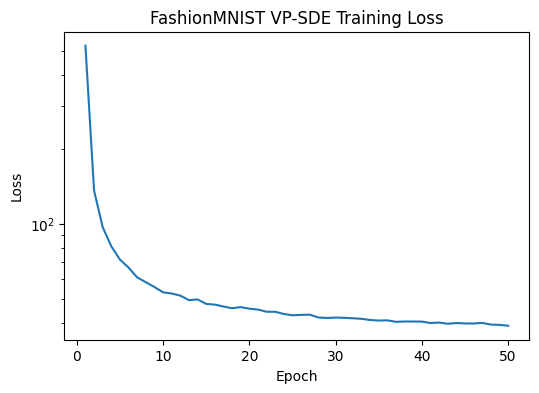

In [12]:
sde_params = [0.01, 10.]
sde, score_model = train(sde_params)

## Generation of new samples

In [13]:
from torchvision.utils import make_grid
def plot_images(images):
    images = images.detach().clamp(0., 1.)
    sample_grid = make_grid(images, nrow=int(np.sqrt(images.shape[0])))
    plt.figure(figsize=(6,6))
    plt.axis('off')
    plt.imshow(sample_grid.cpu().permute(1, 2, 0).squeeze(), cmap='gray')
    plt.show()

In [14]:
def setup_for_sampling(sde_params):
    beta_min, beta_max = sde_params
    params_str = '{}_{}'.format(beta_min, beta_max)
    checkpoint_path = checkpoint_dir+'ckpt_{}_{}epochs_{}.pth'.format("fashionmnist", n_epochs, params_str)

    sde = VP(beta_min, beta_max, num_steps)
    score_model = torch.nn.DataParallel(ScoreNet(marginal_proba=sde.marginal_proba))
    score_model = score_model.to(device)
    score_model.eval()
    score_model.load_state_dict(torch.load(checkpoint_path, map_location=device))

    return sde, score_model

### Sample

In [15]:
sde_params = [0.01, 10.]
sde, score_model = setup_for_sampling(sde_params)

  0%|          | 0/1000 [00:00<?, ?it/s]

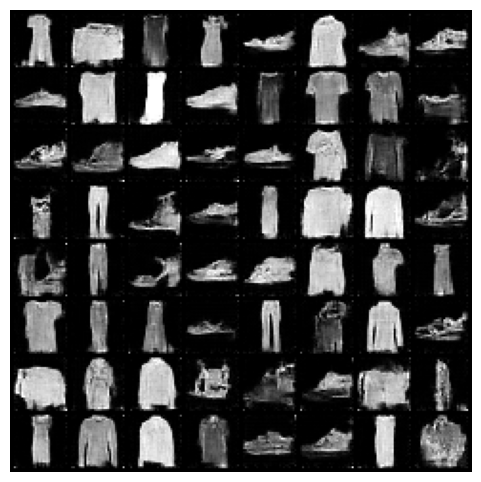

In [16]:
samples = Euler_Maruyama_sampler(score_model, sde, batch_size, num_steps=1000)
plot_images(samples)

  0%|          | 0/1000 [00:00<?, ?it/s]

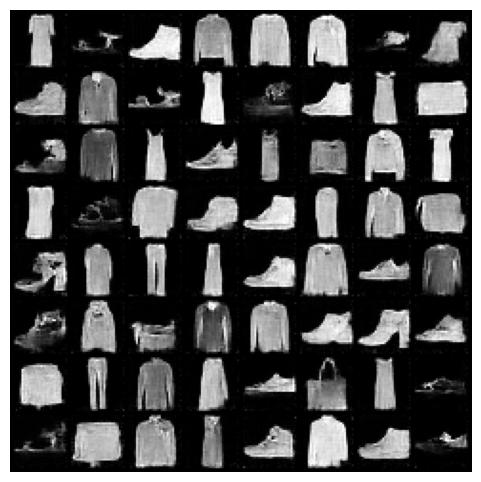

In [17]:
samples = predictor_corrector_sampler(score_model, sde, batch_size, num_steps=1000)
plot_images(samples)

# Part 4B: Diffusion models for inverse problems

## EC (10pts) : inpainting -- keep until you're done with the pset
This part will require you to read and understand [[Song22]](https://arxiv.org/pdf/2111.08005.pdf) Solving Inverse Problems In Medical Imaging With Score-Based Generative Models.

In our toy example, our measurement matrix A will be an explicit inpainting matrix that replaces some of the pixels in an image by 0 (blackening them out).

Your job will be to modify the sampling process to include conditioning on the perturbed measurements at various t.

**Important: do not attempt until you are entirely satisfied with your work for all of the rest of the assignment (Parts 1 through 5).**

**Important: Minimum guidance will be provided in OH or on Piazza. 🎶🎵You're on your own, kid. You always have been🎵🎶**

**Expectations:** The expected result is a plot with 3 rows: clean images, inpainted images, reconstructed images. The plot **must** include the PSNR of each reconstructed image. You should use at least 5 clean images. We wrote the plotting function for you. We also expect you to explain and justify your implementation choices. Everything (plot, explanations, justifications) **must** appear in your submission PDF.

*(hopefully this scratches the itch of those asking for "moar coding" :))*

In [18]:
# helper function to inpaint with 0 pixels and get the subsampling matrix
def inpaint(images, ratio=0.05):
    num_pixels = images.shape[-2] * images.shape[-1]
    num_samples = int(ratio * num_pixels)
    # create subsampling matrix A
    A = torch.eye(num_pixels, device=images.device)
    for pixel in random.sample(range(0, num_pixels), num_samples):
        A[pixel][pixel] = 0
    # black out pixels in images using A (a binary matrix with zeroes where we want to black out pixels)
    inpainted_images = images.clone()
    for i in range(len(images)):
        inpainted_images[i] = torch.reshape(torch.matmul(A, inpainted_images[i].view(num_pixels)), images[0].shape)
    return inpainted_images, A

In [19]:
def psnr(clean, noisy):
    eps = 1e-8
    mse = torch.mean((clean - noisy) ** 2)
    return 20 * torch.log10(torch.tensor(1., device=clean.device) / torch.sqrt(mse + eps))

In [20]:
def plot_before_after(clean_images, imgs_before, imgs_after, title=""):
    assert(imgs_before.shape[0] == imgs_after.shape[0])
    fig, axs = plt.subplots(3, imgs_before.shape[0], figsize=(16, 10))
    for i, images in enumerate([clean_images, imgs_before, imgs_after]):
        for j, image in enumerate(images):
            axs[i][j].imshow(image.detach().cpu().permute(1, 2, 0).squeeze(), cmap='gray')
            axs[i][j].set_xticks([])
            axs[i][j].set_yticks([])
    for j, image in enumerate(imgs_after):
        clean = clean_images[j].detach().cpu().permute(1,2,0).squeeze()
        noisy = image.detach().cpu().permute(1,2,0).squeeze()
        psnr_val = psnr(clean, noisy).item()
        axs[2][j].set_title('PSNR: {:.3f}'.format(psnr_val), y=-0.2)
    fig.suptitle(title, size=20)
    plt.show()

In [21]:
def get_y_t(images, t, marginal_proba):
    if torch.is_tensor(t):
        t = t.to(images.device).float()
        if t.ndim == 0:
            t = t.expand(images.shape[0])
    else:
        t = torch.full((images.shape[0],), float(t), device=images.device)
    z = torch.randn_like(images)
    _, std = marginal_proba(torch.zeros_like(images), t)
    return images + z * std[:, None, None, None]

def lbda_scheduler(t, lbda, param):
    return torch.clamp(lbda * param * t, 0., 1.)

def condition_on_inpainted_y(raw_images, x_t, t, marginal_prob_std, A, lbda=.01, lbda_param=10):
    y_t = get_y_t(raw_images, t, marginal_prob_std)
    lbda = lbda_scheduler(t, lbda, lbda_param).to(x_t.device)
    I = torch.eye(raw_images.shape[-2] * raw_images.shape[-1], device=x_t.device)
    A = A.to(x_t.device)
    flat_y_t = torch.flatten(y_t, start_dim=1)
    flat_x_t = torch.flatten(x_t, start_dim=1)
    observed_y = torch.matmul(flat_y_t, A.T)
    observed_x = torch.matmul(flat_x_t, A.T)
    missing_x = torch.matmul(flat_x_t, (I - A).T)
    x_t_prime = lbda[:, None] * observed_y + (1 - lbda)[:, None] * observed_x + missing_x
    return torch.reshape(x_t_prime, x_t.shape)

def conditional_inpainting_sampler(score_model, sde, corrupted_images, A, num_steps=1000, device='cuda', eps=1e-3, lbda=.02, lbda_param=10):
    device = torch.device(device)
    corrupted_images = corrupted_images.to(device)
    A = A.to(device)
    batch_size = corrupted_images.shape[0]
    t = torch.ones(batch_size, device=device)
    _, std = sde.marginal_proba(torch.zeros_like(corrupted_images), t)
    x = torch.randn_like(corrupted_images) * std[:, None, None, None]
    time_steps = torch.linspace(1., eps, num_steps, device=device)
    step_size = time_steps[0] - time_steps[1]
    with torch.no_grad():
        for time_step in tqdm(time_steps):
            batch_time_steps = torch.ones(batch_size, device=device) * time_step
            score = score_model(x, batch_time_steps)
            drift = sde.drift(x, batch_time_steps)
            diffusion = sde.diffusion(batch_time_steps)[:, None, None, None]
            x_mean = x - (drift - diffusion ** 2 * score) * step_size
            x = x_mean + torch.sqrt(step_size) * diffusion * torch.randn_like(x)
            x = condition_on_inpainted_y(corrupted_images, x, batch_time_steps, sde.marginal_proba, A, lbda=lbda, lbda_param=lbda_param)
    return torch.clamp(x, 0., 1.)

  0%|          | 0/1000 [00:00<?, ?it/s]

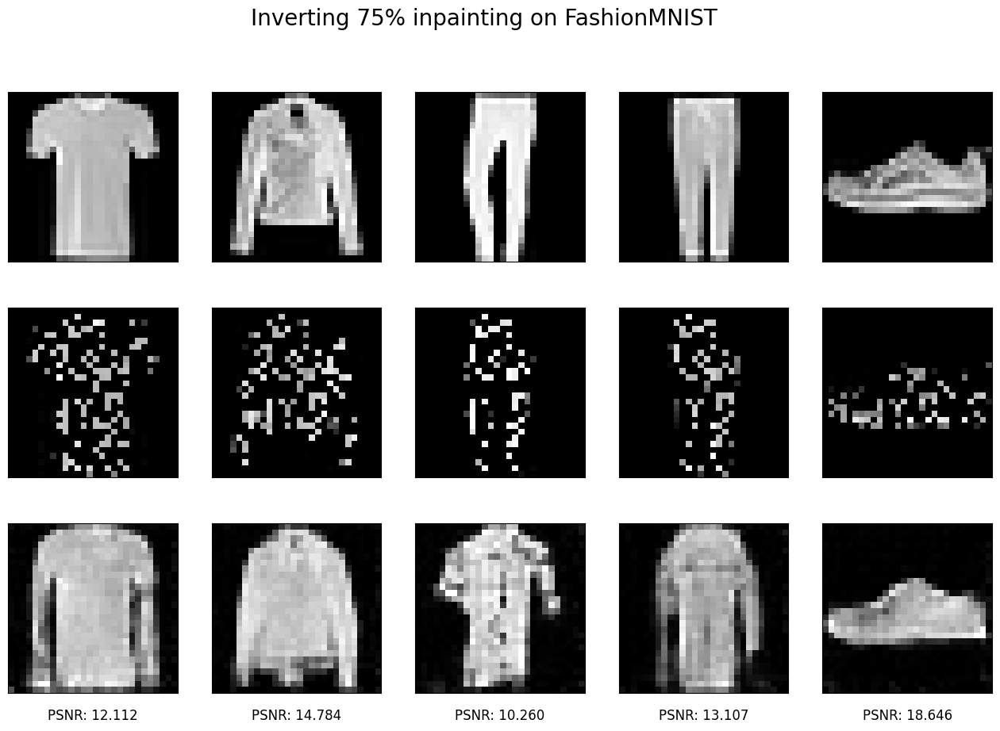

In [22]:
num_images = 5
data, _ = next(iter(train_loader))
clean_images = data[:num_images].to(device)
corrupted_images, A = inpaint(clean_images, ratio=0.75)
recovered_images = conditional_inpainting_sampler(score_model, sde, corrupted_images, A, num_steps=1000, device=device)
plot_before_after(clean_images, corrupted_images, recovered_images, title="Inverting 75% inpainting on FashionMNIST")

# Part 5: Diffusion models on a larger scale

As mentioned in the write-up, you only need to include your code for plotting in this notebook for part 5. Here we provide some helper code if you run the experiments here in Google Colab.

### Helper code

In [23]:
from google.colab import drive
drive.mount('/content/drive')
!pip install blobfile mpi4py

Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 61.7 MB/s eta 0:00:00


#### Guided diffusion setup

In [24]:
import os
import glob

directory = '/content/guided-diffusion'
!test -d {directory} || git clone https://github.com/openai/guided-diffusion.git {directory}
%cd {directory}
!pip install -e .
!mkdir -p models

Cloning into '/content/guided-diffusion'...
remote: Enumerating objects: 113, done.
remote: Total 113 (delta 0), reused 0 (delta 0), pack-reused 113 (from 1)
Receiving objects: 100% (113/113), 67.83 KiB | 347.00 KiB/s, done.
Resolving deltas: 100% (47/47), done.
/content/guided-diffusion
Obtaining file:///content/guided-diffusion
  Preparing metadata (setup.py) ... done
  Running setup.py develop for guided-diffusion


In [25]:
!wget -nc https://openaipublic.blob.core.windows.net/diffusion/jul-2021/256x256_classifier.pt -P {directory}/models
!wget -nc https://openaipublic.blob.core.windows.net/diffusion/jul-2021/256x256_diffusion_uncond.pt -P {directory}/models
%cd {directory}

--2026-05-27 17:51:28--  https://openaipublic.blob.core.windows.net/diffusion/jul-2021/256x256_classifier.pt
Resolving openaipublic.blob.core.windows.net (openaipublic.blob.core.windows.net)... 20.209.18.33
Connecting to openaipublic.blob.core.windows.net (openaipublic.blob.core.windows.net)|20.209.18.33|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 216496432 (206M) [application/octet-stream]
Saving to: ‘/content/guided-diffusion/models/256x256_classifier.pt’

256x256_classifier. 100%[===================>] 206.47M  3.46MB/s    in 62s     

2026-05-27 17:52:30 (3.35 MB/s) - ‘/content/guided-diffusion/models/256x256_classifier.pt’ saved [216496432/216496432]

--2026-05-27 17:52:31--  https://openaipublic.blob.core.windows.net/diffusion/jul-2021/256x256_diffusion_uncond.pt
Resolving openaipublic.blob.core.windows.net (openaipublic.blob.core.windows.net)... 20.209.18.33
Connecting to openaipublic.blob.core.windows.net (openaipublic.blob.core.windows.net)|20.209.

#### Example code for running a script

In [38]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display

BASE_DIR = '/content/hw4_guided_outputs'
os.makedirs(BASE_DIR, exist_ok=True)

MODEL_FLAGS = """
    --attention_resolutions 32,16,8
    --class_cond False
    --diffusion_steps 1000
    --image_size 256
    --learn_sigma True
    --noise_schedule linear
    --num_channels 256
    --num_head_channels 64
    --num_res_blocks 2
    --resblock_updown True
    --use_fp16 True
    --use_scale_shift_norm True
"""
CLASSIFIER_FLAGS = """
    --classifier_attention_resolutions 32,16,8
    --classifier_depth 2
    --classifier_width 128
    --classifier_pool attention
    --classifier_resblock_updown True
    --classifier_use_fp16 True
    --classifier_use_scale_shift_norm True
    --image_size 256
"""

def compact_flags(flags):
    return ' '.join(flags.split())

def latest_npz(save_dir):
    paths = sorted(glob.glob(os.path.join(save_dir, '*.npz')), key=os.path.getmtime)
    if not paths:
        raise FileNotFoundError(save_dir)
    return paths[-1]

def load_npz_images(path_or_dir):
    path = latest_npz(path_or_dir) if os.path.isdir(path_or_dir) else path_or_dir
    data = np.load(path)
    arr = data[data.files[0]]
    if arr.ndim == 5:
        arr = arr.reshape((-1,) + arr.shape[-3:])
    if arr.ndim == 4 and arr.shape[1] in (1, 3) and arr.shape[-1] not in (1, 3):
        arr = np.transpose(arr, (0, 2, 3, 1))
    if arr.dtype != np.uint8:
        if arr.min() < 0:
            arr = (arr + 1.) * 127.5
        elif arr.max() <= 1.:
            arr = arr * 255.
        arr = np.clip(arr, 0, 255).astype(np.uint8)
    if arr.shape[-1] == 1:
        arr = np.repeat(arr, 3, axis=-1)
    return arr

def save_grid(images, rows, cols, out_path):
    images = images[:rows * cols]
    h, w = images.shape[1], images.shape[2]
    canvas = Image.new('RGB', (cols * w, rows * h))
    for idx, img in enumerate(images):
        canvas.paste(Image.fromarray(img.astype(np.uint8)), ((idx % cols) * w, (idx // cols) * h))
    canvas.save(out_path)
    display(canvas)
    print(out_path)
    return out_path

### A: unconditional generation

python scripts/image_sample.py --attention_resolutions 32,16,8 --class_cond False --diffusion_steps 1000 --image_size 256 --learn_sigma True --noise_schedule linear --num_channels 256 --num_head_channels 64 --num_res_blocks 2 --resblock_updown True --use_fp16 True --use_scale_shift_norm True --model_path models/256x256_diffusion_uncond.pt --batch_size 8 --num_samples 8 --timestep_respacing 250
Logging to /content/hw4_guided_outputs/problem_7_1_unconditional
creating model and diffusion...
sampling...
created 8 samples
saving to /content/hw4_guided_outputs/problem_7_1_unconditional/samples_8x256x256x3.npz
/usr/local/lib/python3.12/dist-packages/torch/distributed/c10d_logger.py:83: UserWarning: barrier(): using the device under current context. You can specify `device_id` in `init_process_group` to mute this warning.
  return func(*args, **kwargs)
sampling complete
[rank0]:[W527 20:00:09.042420934 ProcessGroupNCCL.cpp:1575] Warning: WARNING: destroy_process_group() was not called before 

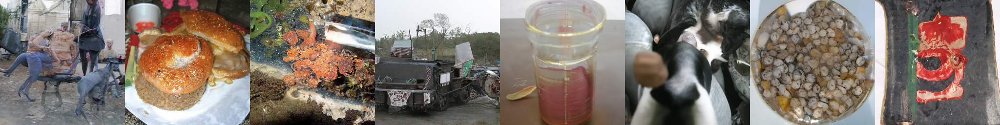

/content/hw4_guided_outputs/problem_7_1_unconditional.png


In [39]:
save_dir = f'{BASE_DIR}/problem_7_1_unconditional'
os.makedirs(save_dir, exist_ok=True)
os.environ['OPENAI_LOGDIR'] = save_dir
model_flags = compact_flags(MODEL_FLAGS)
print(f"python scripts/image_sample.py {model_flags} --model_path models/256x256_diffusion_uncond.pt --batch_size 8 --num_samples 8 --timestep_respacing 250")
!python scripts/image_sample.py {model_flags} --model_path models/256x256_diffusion_uncond.pt --batch_size 8 --num_samples 8 --timestep_respacing 250
problem_7_1_images = load_npz_images(save_dir)[:8]
problem_7_1_path = save_grid(problem_7_1_images, 1, 8, f'{BASE_DIR}/problem_7_1_unconditional.png')

### B: progression over time visualization

  0%|          | 0/250 [00:00<?, ?it/s]

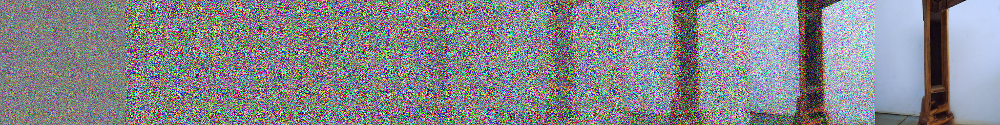

/content/hw4_guided_outputs/problem_7_2_progressive.png


In [40]:
import os
import numpy as np
import torch as th
from guided_diffusion import dist_util
from guided_diffusion.script_util import model_and_diffusion_defaults, create_model_and_diffusion

BASE_DIR = globals().get('BASE_DIR', '/content/hw4_guided_outputs')
os.makedirs(BASE_DIR, exist_ok=True)

if 'save_grid' not in globals():
    from PIL import Image
    from IPython.display import display
    def save_grid(images, rows, cols, out_path):
        images = images[:rows * cols]
        h, w = images.shape[1], images.shape[2]
        canvas = Image.new('RGB', (cols * w, rows * h))
        for idx, img in enumerate(images):
            canvas.paste(Image.fromarray(img.astype(np.uint8)), ((idx % cols) * w, (idx // cols) * h))
        canvas.save(out_path)
        display(canvas)
        print(out_path)
        return out_path

device = th.device('cuda' if th.cuda.is_available() else 'cpu')
model_config = model_and_diffusion_defaults()
model_config.update(dict(
    attention_resolutions='32,16,8',
    class_cond=False,
    diffusion_steps=1000,
    image_size=256,
    learn_sigma=True,
    noise_schedule='linear',
    num_channels=256,
    num_head_channels=64,
    num_res_blocks=2,
    resblock_updown=True,
    use_fp16=True,
    use_scale_shift_norm=True,
    timestep_respacing='250',
))
model, diffusion = create_model_and_diffusion(**model_config)
model.load_state_dict(dist_util.load_state_dict('models/256x256_diffusion_uncond.pt', map_location='cpu'))
model.to(device)
if model_config['use_fp16']:
    model.convert_to_fp16()
model.eval()

def sample_to_uint8(x):
    x = ((x.detach().float().cpu() + 1.) * 127.5).clamp(0, 255).to(th.uint8)
    return x.permute(0, 2, 3, 1).numpy()[0]

def noise_to_uint8(x):
    x = ((x.detach().float().cpu().clamp(-3, 3) + 3.) / 6. * 255.).to(th.uint8)
    return x.permute(0, 2, 3, 1).numpy()[0]

noise = th.randn(1, 3, 256, 256, device=device)
target_steps = set(np.linspace(0, diffusion.num_timesteps - 1, 7, dtype=int).tolist())
frames = [noise_to_uint8(noise)]
with th.no_grad():
    for step, out in enumerate(diffusion.p_sample_loop_progressive(
        model,
        (1, 3, 256, 256),
        noise=noise,
        clip_denoised=True,
        model_kwargs={},
        device=device,
        progress=True,
    )):
        if step in target_steps:
            frames.append(sample_to_uint8(out['sample']))
problem_7_2_images = np.stack(frames[:8], axis=0)
problem_7_2_path = save_grid(problem_7_2_images, 1, 8, f'{BASE_DIR}/problem_7_2_progressive.png')

### C: interpolation visualization

  0%|          | 0/250 [00:00<?, ?it/s]

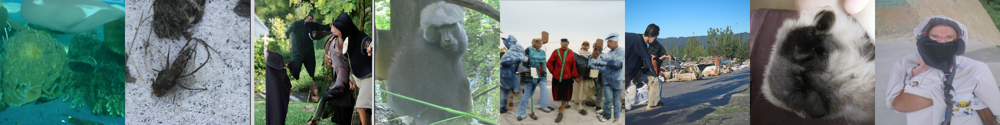

/content/hw4_guided_outputs/problem_7_3_interpolation.png


In [41]:
import os
import numpy as np
import torch as th
from guided_diffusion import dist_util
from guided_diffusion.script_util import model_and_diffusion_defaults, create_model_and_diffusion

BASE_DIR = globals().get('BASE_DIR', '/content/hw4_guided_outputs')
os.makedirs(BASE_DIR, exist_ok=True)

device = th.device('cuda' if th.cuda.is_available() else 'cpu')
if 'model' not in globals() or 'diffusion' not in globals():
    model_config = model_and_diffusion_defaults()
    model_config.update(dict(
        attention_resolutions='32,16,8',
        class_cond=False,
        diffusion_steps=1000,
        image_size=256,
        learn_sigma=True,
        noise_schedule='linear',
        num_channels=256,
        num_head_channels=64,
        num_res_blocks=2,
        resblock_updown=True,
        use_fp16=th.cuda.is_available(),
        use_scale_shift_norm=True,
        timestep_respacing='250',
    ))
    model, diffusion = create_model_and_diffusion(**model_config)
    model.load_state_dict(dist_util.load_state_dict('models/256x256_diffusion_uncond.pt', map_location='cpu'))
    model.to(device)
    if model_config['use_fp16']:
        model.convert_to_fp16()
    model.eval()

th.manual_seed(148)
candidate_noises = th.randn(16, 3, 256, 256, device=device)
flat = candidate_noises.reshape(candidate_noises.shape[0], -1)
dists = th.cdist(flat, flat)
dists.fill_diagonal_(-1.)
i0, i1 = divmod(int(th.argmax(dists).item()), dists.shape[1])
z0, z7 = candidate_noises[i0], candidate_noises[i1]
weights = th.linspace(0., 1., 8, device=device)
interp_noises = th.stack([(1. - w) * z0 + w * z7 for w in weights], dim=0)

with th.no_grad():
    samples = diffusion.p_sample_loop(
        model,
        (8, 3, 256, 256),
        noise=interp_noises,
        clip_denoised=True,
        model_kwargs={},
        device=device,
        progress=True,
    )

problem_7_3_images = ((samples.detach().float().cpu() + 1.) * 127.5).clamp(0, 255).to(th.uint8).permute(0, 2, 3, 1).numpy()
np.savez(f'{BASE_DIR}/problem_7_3_interpolation.npz', problem_7_3_images)
problem_7_3_path = save_grid(problem_7_3_images, 1, 8, f'{BASE_DIR}/problem_7_3_interpolation.png')

### D: conditional generation

python scripts/classifier_sample.py --attention_resolutions 32,16,8 --class_cond False --diffusion_steps 1000 --image_size 256 --learn_sigma True --noise_schedule linear --num_channels 256 --num_head_channels 64 --num_res_blocks 2 --resblock_updown True --use_fp16 True --use_scale_shift_norm True --classifier_attention_resolutions 32,16,8 --classifier_depth 2 --classifier_width 128 --classifier_pool attention --classifier_resblock_updown True --classifier_use_fp16 True --classifier_use_scale_shift_norm True --image_size 256 --classifier_scale 1.0 --classifier_path models/256x256_classifier.pt --model_path models/256x256_diffusion_uncond.pt --batch_size 8 --num_samples 8 --timestep_respacing 250
Logging to /content/hw4_guided_outputs/problem_7_4_conditional
creating model and diffusion...
loading classifier...
sampling...
created 8 samples
saving to /content/hw4_guided_outputs/problem_7_4_conditional/samples_8x256x256x3.npz
/usr/local/lib/python3.12/dist-packages/torch/distributed/c10d_

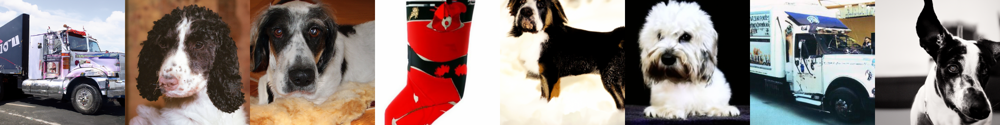

/content/hw4_guided_outputs/problem_7_4_conditional.png


In [42]:
save_dir = f'{BASE_DIR}/problem_7_4_conditional'
os.makedirs(save_dir, exist_ok=True)
os.environ['OPENAI_LOGDIR'] = save_dir
model_flags = compact_flags(MODEL_FLAGS)
classifier_flags = compact_flags(CLASSIFIER_FLAGS)
print(f"python scripts/classifier_sample.py {model_flags} {classifier_flags} --classifier_scale 10.0 --classifier_path models/256x256_classifier.pt --model_path models/256x256_diffusion_uncond.pt --batch_size 8 --num_samples 8 --timestep_respacing 250")
!python scripts/classifier_sample.py {model_flags} {classifier_flags} --classifier_scale 10.0 --classifier_path models/256x256_classifier.pt --model_path models/256x256_diffusion_uncond.pt --batch_size 8 --num_samples 8 --timestep_respacing 250
problem_7_4_images = load_npz_images(save_dir)[:8]
problem_7_4_path = save_grid(problem_7_4_images, 1, 8, f'{BASE_DIR}/problem_7_4_conditional.png')

### E: conditional generation with different classifier scales

python scripts/classifier_sample.py --attention_resolutions 32,16,8 --class_cond False --diffusion_steps 1000 --image_size 256 --learn_sigma True --noise_schedule linear --num_channels 256 --num_head_channels 64 --num_res_blocks 2 --resblock_updown True --use_fp16 True --use_scale_shift_norm True --classifier_attention_resolutions 32,16,8 --classifier_depth 2 --classifier_width 128 --classifier_pool attention --classifier_resblock_updown True --classifier_use_fp16 True --classifier_use_scale_shift_norm True --image_size 256 --classifier_scale 0.0 --classifier_path models/256x256_classifier.pt --model_path models/256x256_diffusion_uncond.pt --batch_size 2 --num_samples 2 --timestep_respacing 250
Logging to /content/hw4_guided_outputs/problem_7_5_scale_0_0
creating model and diffusion...
loading classifier...
sampling...
created 2 samples
saving to /content/hw4_guided_outputs/problem_7_5_scale_0_0/samples_2x256x256x3.npz
/usr/local/lib/python3.12/dist-packages/torch/distributed/c10d_logg

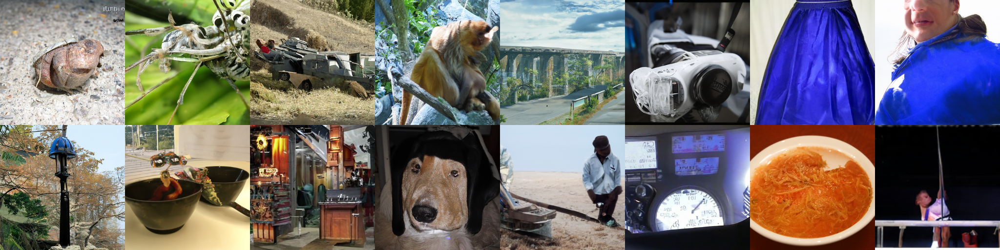

/content/hw4_guided_outputs/problem_7_5_scale_sweep.png


In [43]:
scale_values = [0., 0.25, 0.5, 1., 2., 4., 8., 12.]
model_flags = compact_flags(MODEL_FLAGS)
classifier_flags = compact_flags(CLASSIFIER_FLAGS)
scale_images = []
for scale in scale_values:
    save_dir = f'{BASE_DIR}/problem_7_5_scale_{str(scale).replace(".", "_")}'
    os.makedirs(save_dir, exist_ok=True)
    os.environ['OPENAI_LOGDIR'] = save_dir
    print(f"python scripts/classifier_sample.py {model_flags} {classifier_flags} --classifier_scale {scale} --classifier_path models/256x256_classifier.pt --model_path models/256x256_diffusion_uncond.pt --batch_size 2 --num_samples 2 --timestep_respacing 250")
    !python scripts/classifier_sample.py {model_flags} {classifier_flags} --classifier_scale {scale} --classifier_path models/256x256_classifier.pt --model_path models/256x256_diffusion_uncond.pt --batch_size 2 --num_samples 2 --timestep_respacing 250
    scale_images.append(load_npz_images(save_dir)[:2])
problem_7_5_images = np.stack(scale_images, axis=1).reshape(16, 256, 256, 3)
problem_7_5_path = save_grid(problem_7_5_images, 2, 8, f'{BASE_DIR}/problem_7_5_scale_sweep.png')

### F: extra credit (explore freely)